<a href="https://colab.research.google.com/github/a01137646/NA_Proyecto_Final_Equipo21/blob/main/Proyecto_Final_Equipo21_borrador1_udacity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [55]:
import numpy as np
import matplotlib.pyplot as plt
#import keras
#from keras.models import Sequential
#from keras.optimizers import Adam
#from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
import cv2
import pandas as pd
import random
import os
import ntpath
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
import matplotlib.image as mpimg
from imgaug import augmenters as iaa
import glob


import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adamax, Adam
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, AveragePooling2D, MaxPooling2D

In [56]:
datadir = './Documents/GitHub/NA_Proyecto_Final_Equipo21/DATA/'
list_folders = glob.glob(datadir + '*')

columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.DataFrame()
for path in list_folders:
  data_temp = pd.read_csv(os.path.join(path, 'driving_log.csv'), names = columns)
  data = pd.concat([data,data_temp], ignore_index=True)

#del(data_temp)
print('Cantidad de registros:',len(data.index))
data.head()

Cantidad de registros: 0


""


In [ ]:
data['center'][1]

'C:\\Users\\G\\Downloads\\simulator-windows-64\\DATA\\LAP 1\\IMG\\center_2023_06_09_12_53_24_234.jpg'

In [ ]:
data['center'][1].split('\\')[-3:]


['LAP 1', 'IMG', 'center_2023_06_09_12_53_24_234.jpg']

In [ ]:
def path_leaf(path):
    return '/'.join(path.split('\\')[-3:])

data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,LAP 1/IMG/center_2023_06_09_12_53_24_129.jpg,LAP 1/IMG/left_2023_06_09_12_53_24_129.jpg,LAP 1/IMG/right_2023_06_09_12_53_24_129.jpg,0.0,0.000000,0,0.000082
1,LAP 1/IMG/center_2023_06_09_12_53_24_234.jpg,LAP 1/IMG/left_2023_06_09_12_53_24_234.jpg,LAP 1/IMG/right_2023_06_09_12_53_24_234.jpg,0.0,0.000000,0,0.000083
2,LAP 1/IMG/center_2023_06_09_12_53_24_336.jpg,LAP 1/IMG/left_2023_06_09_12_53_24_336.jpg,LAP 1/IMG/right_2023_06_09_12_53_24_336.jpg,0.0,0.000000,0,0.000082
3,LAP 1/IMG/center_2023_06_09_12_53_24_442.jpg,LAP 1/IMG/left_2023_06_09_12_53_24_442.jpg,LAP 1/IMG/right_2023_06_09_12_53_24_442.jpg,0.0,0.127203,0,0.054509
4,LAP 1/IMG/center_2023_06_09_12_53_24_542.jpg,LAP 1/IMG/left_2023_06_09_12_53_24_542.jpg,LAP 1/IMG/right_2023_06_09_12_53_24_542.jpg,0.0,0.427562,0,0.410255


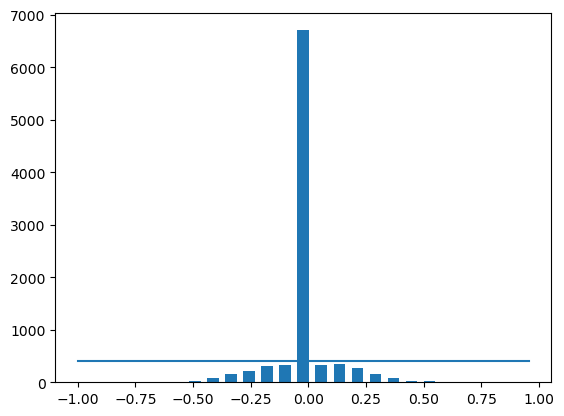

In [ ]:
num_bins = 25

samples_per_bin = 400

hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 9103
removed: 6302
remaining: 2801


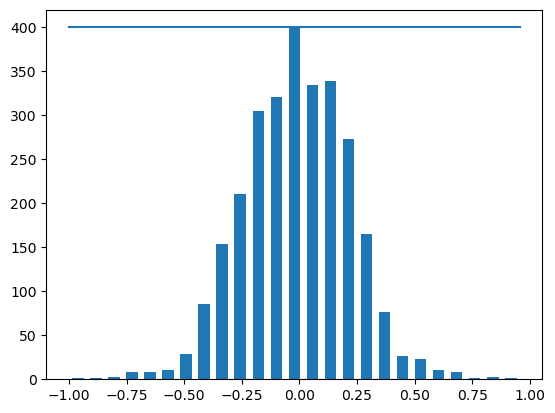

In [ ]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(data['steering'])):
        if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[samples_per_bin:]
    remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [ ]:
print(data.iloc[1])
def load_img_steering(datadir, df):
    image_path = []
    steering = []
    for i in range(len(data)):
        indexed_data = data.iloc[i]
        #center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
        center = indexed_data[0]
        image_path.append(os.path.join(datadir, center.strip()))
        steering.append(float(indexed_data[3]))
        # left image append
        #image_path.append(os.path.join(datadir,left.strip()))
        #steering.append(float(indexed_data[3])+0.15)
        # right image append
        #image_path.append(os.path.join(datadir,right.strip()))
        #steering.append(float(indexed_data[3])-0.15)
    image_paths = np.asarray(image_path)
    steerings = np.asarray(steering)
    return image_paths, steerings

image_paths, steerings = load_img_steering(datadir, data)

center      LAP 1/IMG/center_2023_06_09_12_53_26_703.jpg
left          LAP 1/IMG/left_2023_06_09_12_53_26_703.jpg
right        LAP 1/IMG/right_2023_06_09_12_53_26_703.jpg
steering                                       -0.116761
throttle                                             1.0
reverse                                                0
speed                                           23.33893
Name: 25, dtype: object


In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 6722
Valid Samples: 1681


Text(0.5, 1.0, 'Validation set')

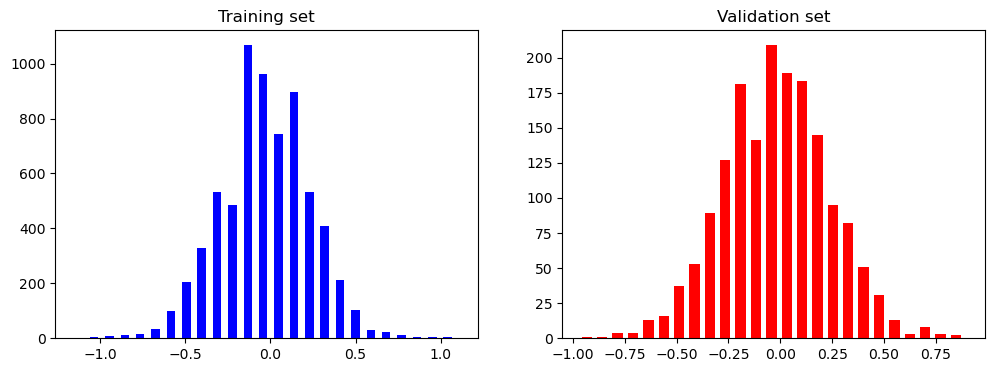

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

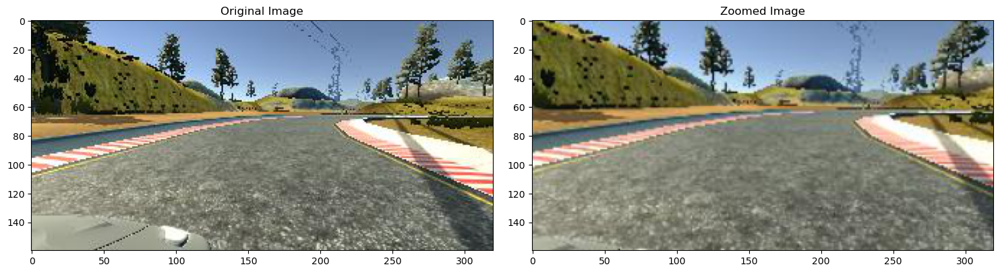

In [ ]:
def zoom(image):
    zoom = iaa.Affine(scale=(1, 1.3))
    image = zoom.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

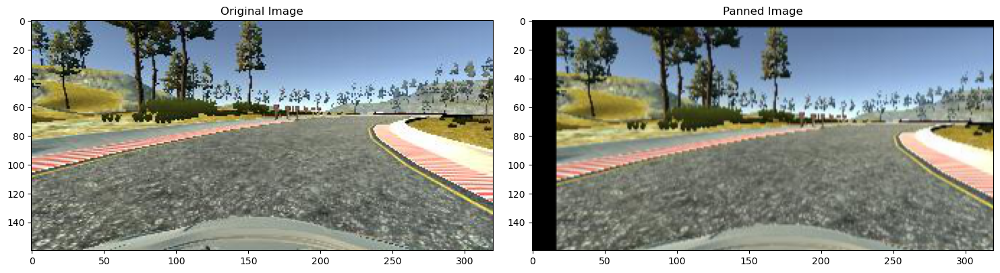

In [ ]:
def pan(image):
    pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

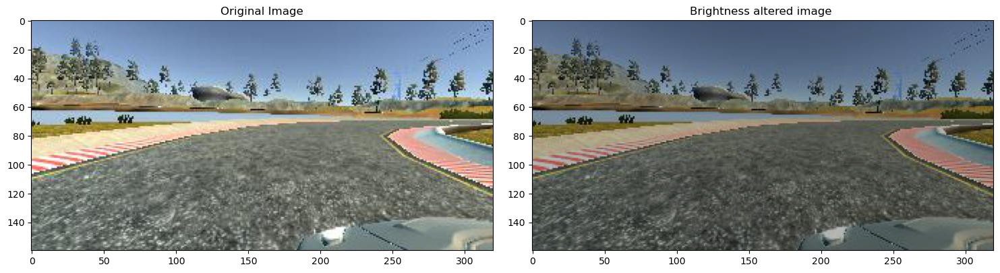

In [ ]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.15')

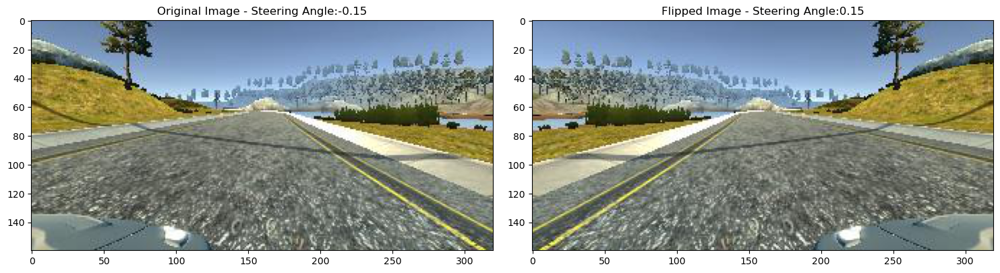

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle


random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [19]:
pan = iaa.TranslateX(percent=(-0.5, 0.5))
pan

TranslateX(name=UnnamedTranslateX, parameters=[Deterministic(float 1.00000000), (Uniform(Deterministic(float -0.50000000), Deterministic(float 0.50000000)), Deterministic(int 0), 'percent'), Deterministic(float 0.00000000), Deterministic(float 0.00000000), Deterministic(int 1), Deterministic(int 0), Deterministic(constant), auto, False], deterministic=False)

In [53]:
random.randint(-15, 15)/100

0.02

In [28]:
def add_steering(image, steering_angle):
    percentage = random.randint(-15, 15)/100
    pan = iaa.TranslateX(percent=(percentage, percentage))
    image = pan.augment_image(image)
    steering_angle = percentage
    return image, steering_angle


image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

NameError: name 'image_paths' is not defined

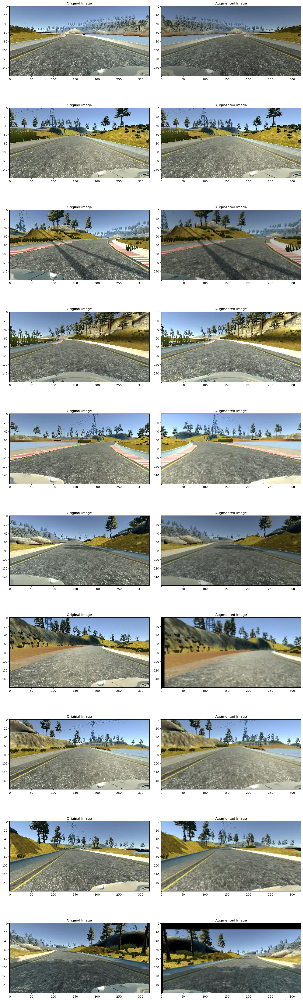

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)
    if np.random.rand() < 0.5 and steering_angle != 0:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle


ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
    randnum = random.randint(0, len(image_paths) - 1)
    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, steering = random_augment(random_image, random_steering)

    axs[i][0].imshow(original_image)
    axs[i][0].set_title("Original Image")

    axs[i][1].imshow(augmented_image)
    axs[i][1].set_title("Augmented Image")

Text(0.5, 1.0, 'Preprocessed Image')

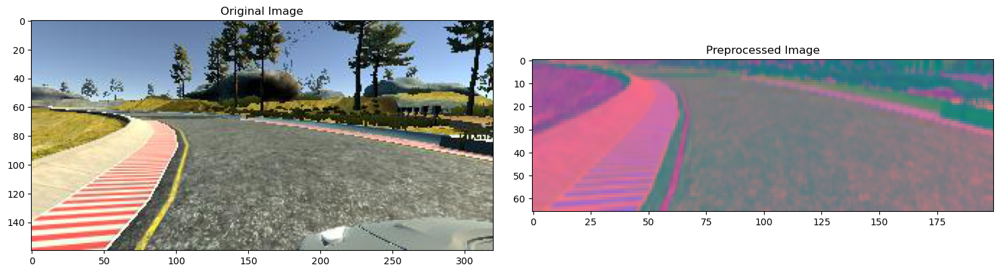

In [ ]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

    while True:
        batch_img =[]
        batch_steering = []

        for i in range(batch_size):

            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
            else:
                im = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

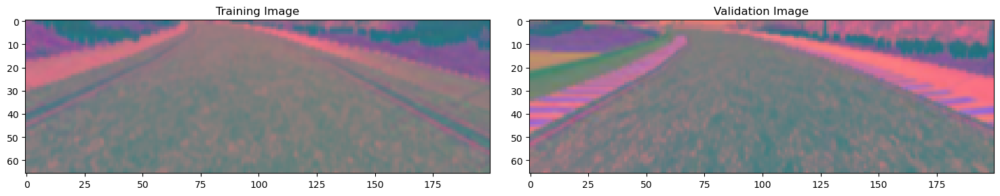

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
def nvidia_model():
    model = tf.keras.Sequential()
    model.add(tf.keras.layers.Conv2D(filters = 24, kernel_size = (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(tf.keras.layers.Conv2D(filters = 36, kernel_size = (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Conv2D(filters = 48, kernel_size = (5, 5), strides=(2, 2), activation='elu'))
    model.add(tf.keras.layers.Conv2D(filters = 64, kernel_size = (3, 3), activation='elu'))

#filters = 32, kernel_size = (3, 3),
#                     input_shape = tensor_X_train.shape[1:],
#                     activation='relu', padding='same'

    model.add(tf.keras.layers.Convolution2D(filters = 64, kernel_size = (3, 3), activation='elu'))
    # model.add(tf.keras.layers.Dropout(0.5))


    model.add(tf.keras.layers.Flatten())

    model.add(tf.keras.layers.Dense(100, activation = 'elu'))

    model.add(tf.keras.layers.Dense(50, activation = 'elu'))


    model.add(tf.keras.layers.Dense(10, activation = 'elu'))


    model.add(tf.keras.layers.Dense(1))

    optimizer = Adam(lr=1e-3)
    model.compile(loss='mse', optimizer=optimizer)
    return model

In [ ]:
model = nvidia_model()
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_6 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_7 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_8 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_9 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten_1 (Flatten)         (None, 1152)              0         
                                                                 
 dense_4 (Dense)             (None, 100)              

C:\Users\G\anaconda3\envs\tf_gpu\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                              steps_per_epoch=300,
                              epochs=10,
                              validation_data=batch_generator(X_valid, y_valid, 100, 0),
                              validation_steps=200,
                              verbose=1,
                              shuffle = 1)

Epoch 1/10
300/300 [==============================] - 87s 290ms/step - loss: 0.0921 - val_loss: 0.0483
Epoch 2/10
300/300 [==============================] - 86s 286ms/step - loss: 0.0467 - val_loss: 0.0323
Epoch 3/10
300/300 [==============================] - 86s 287ms/step - loss: 0.0391 - val_loss: 0.0251
Epoch 4/10
300/300 [==============================] - 87s 292ms/step - loss: 0.0333 - val_loss: 0.0250
Epoch 5/10
300/300 [==============================] - 86s 287ms/step - loss: 0.0324 - val_loss: 0.0233
Epoch 6/10
300/300 [==============================] - 85s 284ms/step - loss: 0.0287 - val_loss: 0.0222
Epoch 7/10
300/300 [==============================] - 86s 287ms/step - loss: 0.0275 - val_loss: 0.0235
Epoch 8/10
300/300 [==============================] - 86s 287ms/step - loss: 0.0271 - val_loss: 0.0228
Epoch 9/10
300/300 [==============================] - 91s 305ms/step - loss: 0.0267 - val_loss: 0.0210
Epoch 10/10
300/300 [==============================] - 87s 292ms/step - l

Text(0.5, 0, 'Epoch')

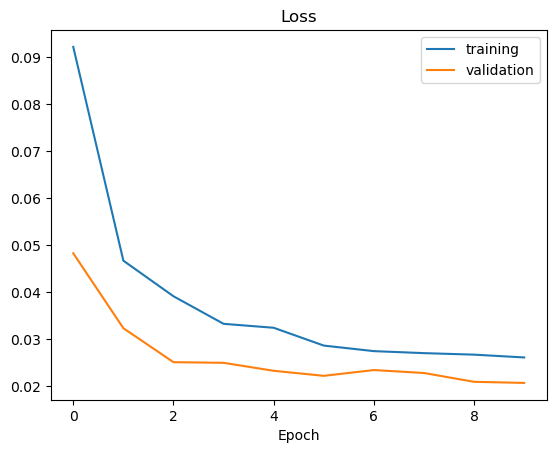

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [ ]:
model.save('./Documents/GitHub/NA_Proyecto_Final_Equipo21/model.h5')

In [1]:
import socketio
import eventlet
import numpy as np
from flask import Flask
from keras.models import load_model
import base64
from io import BytesIO
from PIL import Image
import cv2

In [3]:
sio = socketio.Server()

app = Flask(__name__) #'__main__'
speed_limit = 10
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

In [4]:
@sio.on('telemetry')
def telemetry(sid, data):
    #print(np.asarray(Image.open(BytesIO(base64.b64decode(data['image'])))))
    speed = float(data['speed'])
    image = Image.open(BytesIO(base64.b64decode(data['image'])))
    image = np.asarray(image)
    image = img_preprocess(image)
    image = np.array([image])
    steering_angle = float(model.predict(image,verbose = 0))
    throttle = 1.0 - speed/speed_limit
    #print('{} {} {}'.format(steering_angle, throttle, speed))
    send_control(steering_angle, throttle)

In [5]:
@sio.on('connect')
def connect(sid, environ):
    print('Connected')
    send_control(0, 0)

def send_control(steering_angle, throttle):
    sio.emit('steer', data = {
        'steering_angle': steering_angle.__str__(),
        'throttle': throttle.__str__()
    })

In [6]:
if __name__ == '__main__':
    model = load_model('./Documents/GitHub/NA_Proyecto_Final_Equipo21/model.h5')
    app = socketio.Middleware(sio, app)
    eventlet.wsgi.server(eventlet.listen(('', 4567)), app)

(10316) wsgi starting up on http://0.0.0.0:4567
(10316) accepted ('127.0.0.1', 52349)


Connected


wsgi exiting
127.0.0.1 - - [12/Jun/2023 17:32:35] "GET /socket.io/?EIO=4&transport=websocket HTTP/1.1" 200 0 60.002505
(10316) wsgi exited, is_accepting=True
